In [1]:
from model import *
from data import *

import pandas as pd
import os
from tqdm import tqdm
import shutil
import random
import matplotlib.pyplot as plt
import cv2
import pydicom


Using TensorFlow backend.


In [2]:
import tensorflow as tf
from keras.backend.tensorflow_backend import set_session

config = tf.ConfigProto()
config.gpu_options.allow_growth = True
config.gpu_options.per_process_gpu_memory_fraction = 0.4
set_session(tf.Session(config=config))

In [2]:
DATA_DIR = "/data/krf/dataset/ChinaSet_AllFiles"
ROOT_DIR = "/data/krf/model/unet"
LABEL_DIR = "/data/krf/dataset/"
TEST_DIR = "/data/krf/dataset/stage_1_test_images/"
MASK_DIR = os.path.join(LABEL_DIR,"stage_1_train_masks")
CASE_DIR = "/data/krf/dataset/stage_1_train_images/"

In [6]:
# import os
# import skimage.io as io
# ANOTHER_DIR = "/data/krf/dataset/MontgomerySet/ManualMask"
# leftdir = ANOTHER_DIR+"/leftMask"
# rightdir = ANOTHER_DIR+"/rightMask"
# mlist = os.listdir(leftdir)
# for msk in mlist:
#     img1 = io.imread(os.path.join(leftdir,msk))
#     img2 = io.imread(os.path.join(rightdir,msk))
#     img = img1 + img2
#     print(img.shape)
#     io.imsave(os.path.join("/data/krf/dataset/MontgomerySet/mask",msk),img)

In [7]:
#产生验证集

 
def mymovefile(srcfile,dstfile):
    if not os.path.isfile(srcfile):
        print("%s not exist!"%(srcfile))
    else:
        fpath,fname=os.path.split(dstfile)    #分离文件名和路径
        if not os.path.exists(fpath):
            os.makedirs(fpath)                #创建路径
        shutil.move(srcfile,dstfile)          #移动文件
        print ("move %s -> %s"%( srcfile,dstfile))
 
# def mycopyfile(srcfile,dstfile):
#     if not os.path.isfile(srcfile):
#         print "%s not exist!"%(srcfile)
#     else:
#         fpath,fname=os.path.split(dstfile)    #分离文件名和路径
#         if not os.path.exists(fpath):
#             os.makedirs(fpath)                #创建路径
#         shutil.copyfile(srcfile,dstfile)      #复制文件
#         print "copy %s -> %s"%( srcfile,dstfile)

# import random
# flist = os.listdir(DATA_DIR+"/CXR_png")
# num = 70
# for i in range(num):
#     idx = random.choice(range(len(flist)))
#     img_fp = DATA_DIR+"/CXR_png/"+flist[idx]
# #     new_fp = DATA_DIR+"/val/"+flist[idx]
# #     mymovefile(img_fp,new_fp)
# tlist = os.listdir(DATA_DIR+"/val")
# for t in tlist:
#     img_fp = DATA_DIR+"/CXR_png/"+t
#     new_fp = DATA_DIR+"/val/"+t
#     mymovefile(new_fp,img_fp)

# import random
# flist = os.listdir(DATA_DIR+"/CXR_png")
# mlist = os.listdir(DATA_DIR+"/mask")
# flist.sort()
# mlist.sort()
# num = 70
# for i in range(num):
#     idx = random.choice(range(len(flist)))
#     img_fp = DATA_DIR+"/CXR_png/"+flist[idx]
#     new_fp = DATA_DIR+"/val/"+flist[idx]
#     msk_fp = DATA_DIR+"/mask/"+mlist[idx]
#     nmsk_fp = DATA_DIR+"/val_mask/"+mlist[idx]
#     mymovefile(img_fp,new_fp)
#     mymovefile(msk_fp,nmsk_fp)

In [8]:
data_gen_args = dict(rotation_range=0.2,
                    width_shift_range=0.05,
                    height_shift_range=0.05,
                    shear_range=0.05,
                    zoom_range=0.05,
                    horizontal_flip=True,
                    fill_mode='nearest')
myGene = trainGenerator(8,DATA_DIR,'CXR_png','mask',data_gen_args,save_to_dir = None)
valGene = trainGenerator(8,DATA_DIR,'val','val_mask',data_gen_args,save_to_dir = None)

In [9]:
model = unet()
model_checkpoint = ModelCheckpoint('unet_lung_1015.hdf5',monitor='val_loss',verbose=1, save_best_only=True)

/data/krf/model/unet/model.py:80: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=Tensor("co..., inputs=Tensor("in...)`
  model = Model(input = inputs, output = conv10)


In [10]:
history = model.fit_generator(myGene,steps_per_epoch=100,epochs=20,validation_data = valGene,validation_steps = 100,callbacks=[model_checkpoint])

Epoch 1/8
Found 66 images belonging to 1 classes.
Found 638 images belonging to 1 classes.
Found 66 images belonging to 1 classes.
Found 638 images belonging to 1 classes.
100/100 [==============================] - 118s 1s/step - loss: 0.5128 - acc: 0.7380 - dice: 6.2037e-05 - iou: 3.1020e-05 - val_loss: 0.3754 - val_acc: 0.7444 - val_dice: 6.3294e-05 - val_iou: 3.1648e-05

Epoch 00001: val_loss improved from inf to 0.37536, saving model to unet_lung_1015.hdf5
Epoch 2/8
100/100 [==============================] - 107s 1s/step - loss: 0.3133 - acc: 0.8891 - dice: 0.6970 - iou: 0.5328 - val_loss: 0.2905 - val_acc: 0.9098 - val_dice: 0.7796 - val_iou: 0.5167

Epoch 00002: val_loss improved from 0.37536 to 0.29046, saving model to unet_lung_1015.hdf5
Epoch 3/8
100/100 [==============================] - 107s 1s/step - loss: 0.2781 - acc: 0.9264 - dice: 0.8412 - iou: 0.7236 - val_loss: 0.2937 - val_acc: 0.8821 - val_dice: 0.6724 - val_iou: 0.3887

Epoch 00003: val_loss did not improve from 0.

In [ ]:
# testGene = testGenerator(DATA_DIR+"/test")
# model = unet()
# model.load_weights("unet_lung.hdf5")
# results = model.predict_generator(testGene,30,verbose=1)
# saveResult(DATA_DIR+"/test",DATA_DIR+"/result",results)

In [ ]:
# print(results.shape)
# print(results)

In [ ]:

img_idx = random.choice(range(30))
print(img_idx)

mask = results[img_idx,:,:,0] > 0.5
print(mask)

plt.imshow(mask, cmap=plt.cm.bone)

In [ ]:
IMG_SIZE = 512

def loadDataset(datadir):
    image_fp = os.listdir(datadir)
    image_fp.sort()
    images = []
    for img_nm in image_fp:
        tmp = cv2.imread(os.path.join(datadir,img_nm))
        b,g,r = cv2.split(tmp)
        res = cv2.resize(b,(IMG_SIZE,IMG_SIZE), interpolation=cv2.INTER_AREA).astype(np.uint8)
        images.append(res[:,:,np.newaxis])
    images = np.asarray(images)
    print(images.shape)
    return images

In [ ]:
images = loadDataset(DATA_DIR+"/test")

In [ ]:
plt.figure(figsize=(20, 10))

img_index = random.choice(range(30))

plt.subplot(1,3,1)
random_img = images[img_index,:,:,0]
plt.imshow(random_img, cmap=plt.cm.bone)
plt.axis('off')
plt.title('Lung X-Ray')

mask = results[img_index,:,:,0] > 0.5
print(mask)
plt.subplot(1,3,2)
plt.imshow(mask, cmap=plt.cm.bone)
plt.axis('off')
plt.title('Predicted Mask')

plt.subplot(1,3,3)
plt.imshow(cv2.bitwise_and(random_img, random_img, mask=mask.astype(np.uint8)), cmap=plt.cm.bone)
plt.axis('off')
plt.title('Predicted Lung Segmentation')

In [ ]:
croped = cv2.bitwise_and(random_img, random_img, mask=mask.astype(np.uint8))

In [ ]:
print(croped.shape)
plt.imshow(croped, cmap=plt.cm.bone)

In [2]:

case_list = os.listdir(CASE_DIR)
case_nm ="02c2331d-b3fa-4d55-bf86-f0efbd589c86.dcm"
case_fp = os.path.join(CASE_DIR,case_nm)

In [5]:
def testGenerator2(test_path,num_image,target_size = (256,256),flag_multi_class = False,as_gray = True):
    f_list = os.listdir(test_path)
    f_list.sort()
    for f in f_list[:num_image]:
        #img = io.imread(os.path.join(test_path,f),as_gray = as_gray)
        img = pydicom.read_file(os.path.join(test_path,f)).pixel_array
        img = img / 255
        img = trans.resize(img,target_size)
        img = np.reshape(img,img.shape+(1,)) if (not flag_multi_class) else img
        img = np.reshape(img,(1,)+img.shape)
        yield img

In [17]:
num_img = len(os.listdir(CASE_DIR))
#num_img = 1000
testGene2 = testGenerator2(CASE_DIR,num_img)
model2 = unet()
model2.load_weights("unet_lung_1015.hdf5")
results2 = model2.predict_generator(testGene2,num_img,verbose=1)
#saveResult(DATA_DIR+"/test",DATA_DIR+"/result",results)

25684/25684 [==============================] - 932s 36ms/step


KeyboardInterrupt: 

In [10]:
def saveResult2(test_path,save_path,npyfile,flag_multi_class = False,num_class = 2):
    f_list = os.listdir(test_path)
    f_list.sort()
    for i,item in enumerate(npyfile):
        img = labelVisualize(num_class,COLOR_DICT,item) if flag_multi_class else item[:,:,0]
        io.imsave(os.path.join(save_path,f_list[i].split('.')[0]+".png"),img)
        
#saveResult2(CASE_DIR,LABEL_DIR+"/stage_1_train_masks",results4.astype(np.uint8)*[255])

In [22]:

results4 = results2>0.5
print(results4[0,:,:,0])

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]


In [6]:

num_img = len(os.listdir(MASK_DIR))
#num_img = 1000
mskGene = testGenerator(MASK_DIR,num_img)
trainGene = testGenerator2(CASE_DIR,num_img)

In [9]:
def geneSeg(testGene,mskGene,num,msk_dir,result_dir):
    f_list = os.listdir(msk_dir)
    f_list.sort()
    for i in range(num):
        img = testGene.__next__()
        msk = mskGene.__next__()
        croped = cv2.bitwise_and(img[0,:,:,0],img[0,:,:,0],mask=msk[0,:,:,0].astype(np.uint8))
        #seg = labelVisualize(2,COLOR_DICT,croped)
        #io.imsave(os.path.join(result_dir,f_list[i]),croped)
        print("img")
        for i in range(256):
            print(img[0,i,:,0])
        print("msk")
        for i in range(256):
            print(msk[0,i,:,0])
        print ("crop")
        for i in range(256):
            print(croped[i,:])
        

In [10]:
geneSeg(trainGene,mskGene,5,MASK_DIR,LABEL_DIR+"/stage_1_train_segmentations") 

img
[0.07647059 0.00490196 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.00196078 0.00196078 0.         0.
 0.00196078 0.00196078 0.00098039 0.00098039 0.06960784 0.15588235
 0.13235294 0.15196078 0.1745098  0.20490196 0.23039216 0.2627451
 0.28333333 0.29803922 0.30980392 0.3245098  0.33529412 0.34901961
 0.35490196 0.37156863 0.37254902 0.40392157 0.43529412 0.43627451
 0.43431373 0.4519607

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.53921569
 0.52647059 0.5245098  0.51372549 0.52647059 0.54215686 0.5627451
 0.57058824 0.57058824 0.59411765 0.60490196 0.59509804 0.59215686
 0.59803922 0.58921569 0.5745098  0.55980392 0.54607843 0.52156863
 0.50294118 0.47352941 0.45392157 0.42058824 0.35686275 0.33823529
 0.32058824 0.30098039 0.29411765 0.28529412 0.3        0.27352941
 0.25588235 0.25980392 0.28235294 0.30882353 0.32843137 0.37843137
 0.37352941 0.36960784 0.35       0.32647059 0.34019608 0.32352941
 0.30490196 0.36078431 0.39509804 0.4372549  0.4627451  0.49411765
 0.54117647 0.61176471 0.60686275 0.56372549 0.54019608 0.53333333
 0.52745098 0.49313725 0.52352941 0.

img
[0.80490196 0.79313725 0.75784314 0.75294118 0.73137255 0.72647059
 0.70686275 0.7        0.69509804 0.6872549  0.69019608 0.67941176
 0.67941176 0.6627451  0.66176471 0.6627451  0.65098039 0.65392157
 0.64313725 0.63921569 0.64313725 0.63333333 0.63235294 0.64019608
 0.63431373 0.62058824 0.63137255 0.62647059 0.62843137 0.62352941
 0.62058824 0.6254902  0.61764706 0.62352941 0.6254902  0.61960784
 0.6245098  0.62254902 0.61666667 0.62058824 0.62156863 0.61568627
 0.62843137 0.62647059 0.62843137 0.6245098  0.61764706 0.62647059
 0.62156863 0.62254902 0.6245098  0.62156863 0.63137255 0.63137255
 0.62352941 0.62254902 0.6254902  0.62745098 0.62941176 0.62647059
 0.63039216 0.63431373 0.62745098 0.6372549  0.62941176 0.6372549
 0.64313725 0.64117647 0.64313725 0.63921569 0.64117647 0.65
 0.63921569 0.64901961 0.65098039 0.64803922 0.64705882 0.65392157
 0.70588235 0.80098039 0.8627451  0.89509804 0.91372549 0.93137255
 0.93823529 0.94607843 0.95196078 0.95588235 0.95784314 0.9676470

[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.59705882
 0.5627451  0.58529412 0.48137255 0.40882353 0.37941176 0.34313725
 0.32058824 0.29019608 0.28235294 0.27843137 0.29215686 0.30098039
 0.28333333 0.25980392 0.25980392 0.25980392 0.25686275 0.24019608
 0.2127451  0.2254902  0.19803922 0.20196078 0.21960784 0.21470588
 0.24215686 0.24117647 0.25980392 0.27843137 0.2745098  0.25490196
 0.27647059 0.25098039 0.24607843 0.27745098 0.29215686 0.27941176
 0.28627451 0.29607843 0.33235294 0.32254902 0.34901961 0.34313725
 0.34705882 0.33921569 0.35392157 0.3627451  0.3794

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



img
[0.00294118 0.00392157 0.00392157 0.00392157 0.00784314 0.00784314
 0.00392157 0.00392157 0.00392157 0.00392157 0.00392157 0.00392157
 0.00784314 0.00784314 0.00784314 0.00784314 0.00784314 0.00784314
 0.00784314 0.00784314 0.00784314 0.00784314 0.00784314 0.00784314
 0.00784314 0.00784314 0.00980392 0.00980392 0.01176471 0.01372549
 0.00980392 0.01176471 0.01470588 0.01568627 0.01960784 0.02058824
 0.02254902 0.02843137 0.03137255 0.03627451 0.04019608 0.04705882
 0.04901961 0.05490196 0.06078431 0.06372549 0.07058824 0.06764706
 0.07156863 0.07843137 0.07647059 0.0754902  0.07647059 0.09117647
 0.13235294 0.14215686 0.13333333 0.15686275 0.16666667 0.16764706
 0.16470588 0.17254902 0.18529412 0.19607843 0.22745098 0.21764706
 0.2372549  0.25490196 0.25588235 0.27941176 0.2872549  0.29411765
 0.29705882 0.30686275 0.28823529 0.32843137 0.32647059 0.33431373
 0.34019608 0.35784314 0.34411765 0.36568627 0.35196078 0.38431373
 0.37156863 0.37058824 0.38529412 0.38235294 0.38823529 0.

[0.19509804 0.25294118 0.27254902 0.30882353 0.25980392 0.25392157
 0.28137255 0.25784314 0.27254902 0.27941176 0.26470588 0.24901961
 0.29019608 0.33235294 0.34901961 0.35098039 0.36372549 0.36568627
 0.3754902  0.36470588 0.34705882 0.33529412 0.33627451 0.3627451
 0.34705882 0.32941176 0.32941176 0.33529412 0.33627451 0.3
 0.31078431 0.31176471 0.3245098  0.32941176 0.3127451  0.36470588
 0.39607843 0.37352941 0.36078431 0.37156863 0.38235294 0.39705882
 0.38039216 0.36666667 0.3745098  0.37156863 0.39019608 0.36666667
 0.36862745 0.35784314 0.33627451 0.35196078 0.35882353 0.36372549
 0.39215686 0.37254902 0.38137255 0.40686275 0.41078431 0.38921569
 0.3754902  0.36568627 0.38039216 0.39901961 0.40588235 0.44019608
 0.45294118 0.4372549  0.43333333 0.43039216 0.44803922 0.45392157
 0.46078431 0.45294118 0.45882353 0.43333333 0.35392157 0.28529412
 0.30686275 0.31666667 0.28529412 0.30294118 0.30980392 0.36764706
 0.33235294 0.34607843 0.31470588 0.35392157 0.37058824 0.37843137
 0.

In [ ]:
num_img = len(os.listdir(MASK_DIR))
#num_img = 1000
mskGene = testGenerator(MASK_DIR,num_img)
trainGene = testGenerator2(CASE_DIR,num_img)

In [ ]:
croped = np.bitwise_and(imgs,results4)

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/matplotlib/pyplot.py:513: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


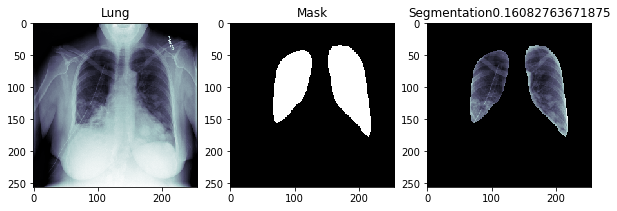

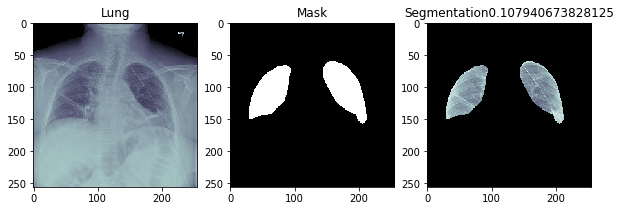

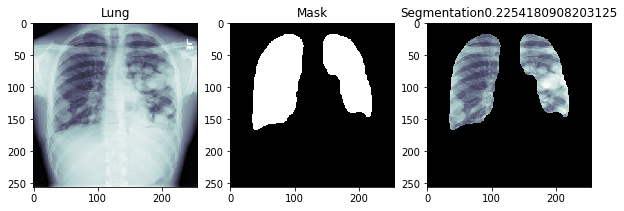

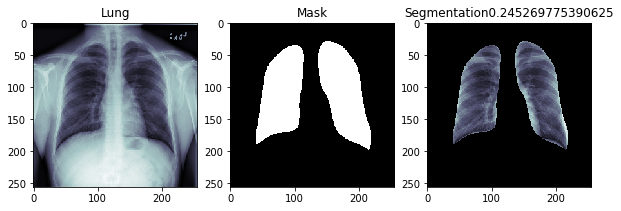

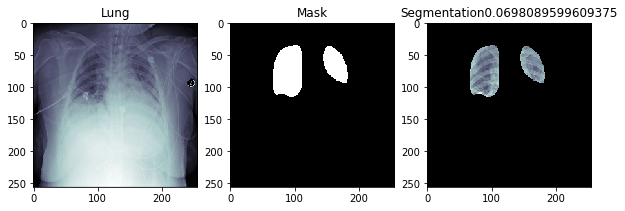

...

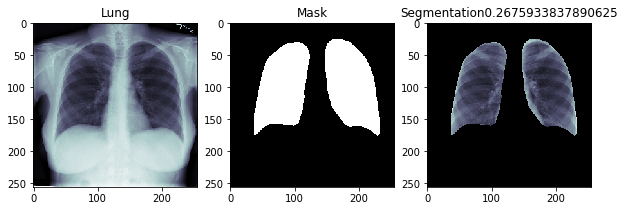

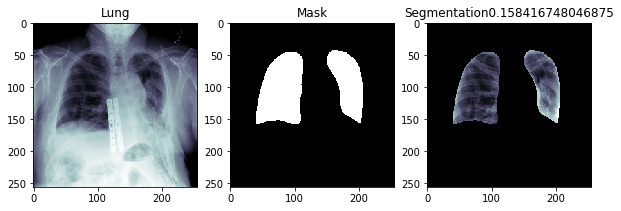

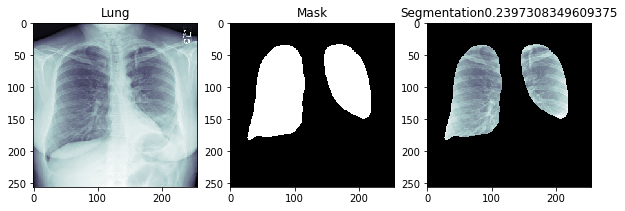

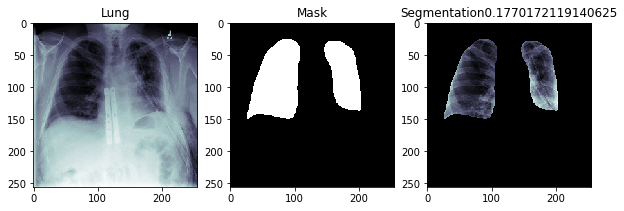

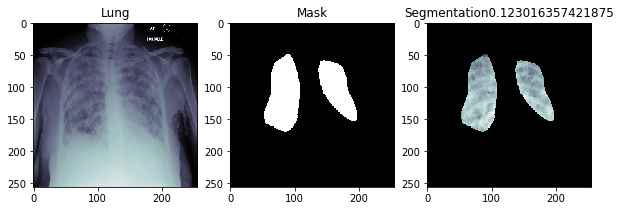

In [10]:
idx = 0
num_img = 50
import cv2
import matplotlib.pyplot as plt
for img1 in testGenerator2(CASE_DIR,num_img):
#for img1 in testGene2:
    #print(img1.shape)
    plt.figure(figsize=(10,20))
    plt.subplot(1,3,1)
    
    plt.imshow(img1[0,:,:,0],cmap=plt.cm.bone)
    #plt.axes('off')
    plt.title("Lung")
    
    plt.subplot(1,3,2)
    mask = results2[idx,:,:,0] > 0.5
    #print(mask.shape)
    plt.imshow(mask,cmap=plt.cm.bone)
    #plt.axes('off')
    plt.title("Mask")
    
    plt.subplot(1,3,3)
    croped = cv2.bitwise_and(img1[0,:,:,0],img1[0,:,:,0],mask=mask.astype(np.uint8))
    #print(croped.shape)
    plt.imshow(croped,cmap=plt.cm.bone)
    #plt.axes('off')
    plt.title("Segmentation"+str(np.sum(mask==True)/256/256))
    idx += 1
#     if idx >= num_img:
#         break
    
# img = pydicom.read_file(case_fp).pixel_array
# #img = np.stack([img]*3, -1)
# import skimage.transform as trans
# img_re = trans.resize(img,(256,256))

# plt.imshow(img_re, cmap=plt.cm.bone)
# _mask = result[0,:,:,0] > 0.5
# print(_mask)

# plt.imshow(_mask, cmap=plt.cm.bone)

# croped = cv2.bitwise_and(img_re, img_re, mask=_mask.astype(np.uint8))
# print(croped.shape)
# plt.imshow(croped, cmap=plt.cm.bone)


In [ ]:
cntMask = np.sum(mask == True)
print(cntMask)
print(cntMask/256/256)

[0. 0. 0. 0. 0. 0. 0. 0.]
[  4.  38.  64. 183. 274. 246. 140.  51.]


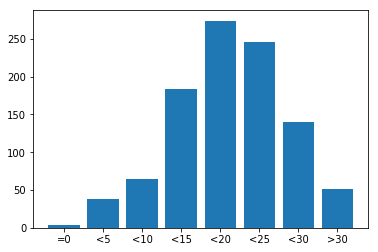

In [13]:
c = np.zeros(8)
print(c)
for msk in results2:
    #print(msk.shape)
    #print(msk[:,:,0])
    cnt = np.sum(msk[:,:,0] >0.5)/256./256.
    if  cnt == 0:
        c[0] += 1
    elif cnt <= 0.05:
        c[1] += 1
    elif cnt <= 0.1:
        c[2] += 1
    elif cnt <= 0.15:
        c[3] += 1
    elif cnt <= 0.2:
        c[4] += 1
    elif cnt <= 0.25:
        c[5] += 1
    elif cnt <= 0.3:
        c[6] += 1
    else:
        c[7] += 1
print(c)
b = ["=0","<5","<10","<15","<20","<25","<30",">30"]
plt.bar(b, c)
plt.show()

In [8]:

testGene3 = testGenerator2(TEST_DIR,1000)
model3 = unet()
model3.load_weights("unet_lung_1015.hdf5")
results3 = model3.predict_generator(testGene3,1000,verbose=1)

/data/krf/model/unet/model.py:80: UserWarning: Update your `Model` call to the Keras 2 API: `Model(outputs=Tensor("co..., inputs=Tensor("in...)`
  model = Model(input = inputs, output = conv10)


1000/1000 [==============================] - 45s 45ms/step


[0. 0. 0. 0. 0. 0. 0. 0.]
[  3.  22.  86. 169. 255. 273. 142.  50.]


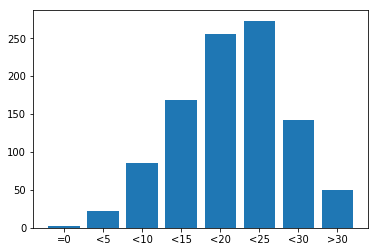

In [9]:
c2 = np.zeros(8)
print(c2)
for msk in results3:
    #print(msk.shape)
    #print(msk[:,:,0])
    cnt = np.sum(msk[:,:,0] >0.5)/256./256.
    if  cnt == 0:
        c2[0] += 1
    elif cnt <= 0.05:
        c2[1] += 1
    elif cnt <= 0.1:
        c2[2] += 1
    elif cnt <= 0.15:
        c2[3] += 1
    elif cnt <= 0.2:
        c2[4] += 1
    elif cnt <= 0.25:
        c2[5] += 1
    elif cnt <= 0.3:
        c2[6] += 1
    else:
        c2[7] += 1
print(c2)
b = ["=0","<5","<10","<15","<20","<25","<30",">30"]
plt.bar(b, c2)
plt.show()

In [6]:

annots = pd.read_csv(os.path.join(LABEL_DIR, "stage_1_train_labels.csv"))
annots.head()

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1


In [49]:
num_show = 100
cnt = 1

for row in tqdm(annots.values[:num_show]):
    t = row[5] 
    if t == 1:
        #plt.figure(figsize=(10,10))
        patient_id = row[0]

        x = int(row[1])
        y = int(row[2])
        w = int(row[3])
        h = int(row[4])
        box = np.zeros([1024,1024])
        tmp = np.zeros([1024])
        tmp[x:x+w+1] = 1
        box[y:y+h+1] = tmp
        box =trans.resize(box,(256,256))
        box = np.expand_dims(np.expand_dims(box,axis = 0),axis=3)
#         x = x*256/1024
#         y = y*256/1024
#         w = w*256/1024
#         h = h*256/1024
        print(patient_id)
        img_fp = LABEL_DIR+"/stage_1_train_segmentations/"+patient_id+".png"
        seg = cv2.imread(img_fp)/[255.]
        seg = np.expand_dims(np.expand_dims(seg,axis = 0),axis=3)
        iu = iou(box,seg)
        print()
#         img = pydicom.read_file(CASE_DIR+"/"+patient_id+".dcm").pixel_array
#         img = trans.resize(img,(256,256))
#         plt.subplot(1,2,1)
#         plt.imshow(img,cmap=plt.cm.bone)
#         plt.plot([x, x, x+w, x+w, x], [y, y+h, y+h, y, y])
        
#         plt.subplot(1,2,2)
#         plt.imshow(seg,cmap=plt.cm.bone)
#         plt.plot([x, x, x+w, x+w, x], [y, y+h, y+h, y, y])
#         cnt+=1
        

  9%|▉         | 9/100 [00:00<00:01, 73.67it/s]

00436515-870c-4b36-a041-de91049b9ab4
Tensor("strided_slice_49:0", shape=(), dtype=float64)
00436515-870c-4b36-a041-de91049b9ab4
Tensor("strided_slice_50:0", shape=(), dtype=float64)
00704310-78a8-4b38-8475-49f4573b2dbb
Tensor("strided_slice_51:0", shape=(), dtype=float64)
00704310-78a8-4b38-8475-49f4573b2dbb
Tensor("strided_slice_52:0", shape=(), dtype=float64)
00aecb01-a116-45a2-956c-08d2fa55433f
Tensor("strided_slice_53:0", shape=(), dtype=float64)
00aecb01-a116-45a2-956c-08d2fa55433f


 20%|██        | 20/100 [00:00<00:01, 53.61it/s]

Tensor("strided_slice_54:0", shape=(), dtype=float64)
00c0b293-48e7-4e16-ac76-9269ba535a62
Tensor("strided_slice_55:0", shape=(), dtype=float64)
00c0b293-48e7-4e16-ac76-9269ba535a62
Tensor("strided_slice_56:0", shape=(), dtype=float64)
00f08de1-517e-4652-a04f-d1dc9ee48593
Tensor("strided_slice_57:0", shape=(), dtype=float64)
00f08de1-517e-4652-a04f-d1dc9ee48593
Tensor("strided_slice_58:0", shape=(), dtype=float64)
0100515c-5204-4f31-98e0-f35e4b00004a
Tensor("strided_slice_59:0", shape=(), dtype=float64)
010ccb9f-6d46-4380-af11-84f87397a1b8


 29%|██▉       | 29/100 [00:00<00:01, 47.39it/s]

Tensor("strided_slice_60:0", shape=(), dtype=float64)
010ccb9f-6d46-4380-af11-84f87397a1b8
Tensor("strided_slice_61:0", shape=(), dtype=float64)
012a5620-d082-4bb8-9b3b-e72d8938000c
Tensor("strided_slice_62:0", shape=(), dtype=float64)
012a5620-d082-4bb8-9b3b-e72d8938000c
Tensor("strided_slice_63:0", shape=(), dtype=float64)
0174c4bb-28f5-41e3-a13f-a396badc18bd
Tensor("strided_slice_64:0", shape=(), dtype=float64)
0174c4bb-28f5-41e3-a13f-a396badc18bd
Tensor("strided_slice_65:0", shape=(), dtype=float64)
019d950b-dd38-4cf3-a686-527a75728be6


 44%|████▍     | 44/100 [00:00<00:01, 52.87it/s]

Tensor("strided_slice_66:0", shape=(), dtype=float64)
019d950b-dd38-4cf3-a686-527a75728be6
Tensor("strided_slice_67:0", shape=(), dtype=float64)
01a6eaa6-222f-4ea8-9874-bbd89dc1a1ce
Tensor("strided_slice_68:0", shape=(), dtype=float64)
01a6eaa6-222f-4ea8-9874-bbd89dc1a1ce
Tensor("strided_slice_69:0", shape=(), dtype=float64)
01a7353d-25bb-4ff8-916b-f50dd541dccf
Tensor("strided_slice_70:0", shape=(), dtype=float64)
01a7353d-25bb-4ff8-916b-f50dd541dccf
Tensor("strided_slice_71:0", shape=(), dtype=float64)
01adfd2f-7bc7-4cef-ab68-a0992752b620
Tensor("strided_slice_72:0", shape=(), dtype=float64)
01b9e362-4950-40f5-88fa-7557ac2a45bb


 59%|█████▉    | 59/100 [00:01<00:00, 55.73it/s]

Tensor("strided_slice_73:0", shape=(), dtype=float64)
01b9e362-4950-40f5-88fa-7557ac2a45bb
Tensor("strided_slice_74:0", shape=(), dtype=float64)
01be392f-a46d-4aef-a57e-9cd1a80dd47e
Tensor("strided_slice_75:0", shape=(), dtype=float64)
01be392f-a46d-4aef-a57e-9cd1a80dd47e
Tensor("strided_slice_76:0", shape=(), dtype=float64)
01cad8d0-45cd-4603-b099-94055d322310
Tensor("strided_slice_77:0", shape=(), dtype=float64)
01cad8d0-45cd-4603-b099-94055d322310
Tensor("strided_slice_78:0", shape=(), dtype=float64)
01cd2ba5-2baf-44b2-bf15-ee57e1ea4599
Tensor("strided_slice_79:0", shape=(), dtype=float64)


 81%|████████  | 81/100 [00:01<00:00, 68.01it/s]

01d4fa0f-97a0-4522-b0d8-134400db2a3e
Tensor("strided_slice_80:0", shape=(), dtype=float64)
01d4fa0f-97a0-4522-b0d8-134400db2a3e
Tensor("strided_slice_81:0", shape=(), dtype=float64)
01dc817c-3cfa-49fe-8662-518edc30652a
Tensor("strided_slice_82:0", shape=(), dtype=float64)
01f3abc2-33c7-4ea2-a599-dc49b76fcfae
Tensor("strided_slice_83:0", shape=(), dtype=float64)
01f3abc2-33c7-4ea2-a599-dc49b76fcfae
Tensor("strided_slice_84:0", shape=(), dtype=float64)
01fa0f5e-00c3-41cb-b5c7-10600c8633ae
Tensor("strided_slice_85:0", shape=(), dtype=float64)
01fa0f5e-00c3-41cb-b5c7-10600c8633ae
Tensor("strided_slice_86:0", shape=(), dtype=float64)
01fdfd88-7607-48b9-ba05-a36e8b6fd19b
Tensor("strided_slice_87:0", shape=(), dtype=float64)
01fdfd88-7607-48b9-ba05-a36e8b6fd19b
Tensor("strided_slice_88:0", shape=(), dtype=float64)
02002619-3dea-4038-8d4d-458db30ed8de


 89%|████████▉ | 89/100 [00:01<00:00, 41.79it/s]

Tensor("strided_slice_89:0", shape=(), dtype=float64)
02002619-3dea-4038-8d4d-458db30ed8de
Tensor("strided_slice_90:0", shape=(), dtype=float64)
020380f8-5c5a-4ded-bdf3-9ce3036945b4
Tensor("strided_slice_91:0", shape=(), dtype=float64)
020380f8-5c5a-4ded-bdf3-9ce3036945b4
Tensor("strided_slice_92:0", shape=(), dtype=float64)
02099738-7465-4786-b71c-de8cdac477c3
Tensor("strided_slice_93:0", shape=(), dtype=float64)
02099738-7465-4786-b71c-de8cdac477c3
Tensor("strided_slice_94:0", shape=(), dtype=float64)
020a16e3-baf9-4cf0-859c-c79b5253d717
Tensor("strided_slice_95:0", shape=(), dtype=float64)


100%|██████████| 100/100 [00:01<00:00, 55.39it/s]

020a16e3-baf9-4cf0-859c-c79b5253d717
Tensor("strided_slice_96:0", shape=(), dtype=float64)
02285fa4-35b7-4af6-b88f-3cac45a7f5c8
Tensor("strided_slice_97:0", shape=(), dtype=float64)


In [12]:
results5 = results3>0.5
saveResult2(TEST_DIR,LABEL_DIR+"/stage_1_test_masks",results5.astype(np.uint8)*[255])

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/000924cf-0f8d-42bd-9158-1af53881a557.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/000db696-cf54-4385-b10b-6b16fbb3f985.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/000fe35a-2649-43d4-b027-e67796d412e0.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/001031d9-f904-4a23-b3e5-2c088acd19c6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/pyt

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/03a512bc-1162-404e-8c71-dc9e0dc7258f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/03a9b990-18bb-4370-ac03-7fa385ea72bf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/03aeb73d-0520-48ad-b21a-8249dfcf95d8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/03c6601a-9044-447d-8521-eca222ea1c1e.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/pyt

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/0db60a41-2a6a-421b-a304-8799739eaec5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/0dd92ecf-3247-4a0c-a77e-21d20fddcc2a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/0ded4efe-1a9a-4980-aca2-9d2c49632917.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/0e03c2d7-9cea-4dc7-8e91-794a8b3ff58d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/pyt

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/101921f9-4651-41e1-b7dc-8e0124d5a5d1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/101e82b5-8be1-4318-84c9-0c64813f9ac5.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/103451bb-1f8c-4209-abce-0be7e9a6c8fb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/10442f49-c354-44f8-8ca2-a4652713285a.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/pyt

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/13cca55a-615f-4f7c-9061-7d12185baace.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/13e7e928-b7d0-4191-8eb5-b56aaa31edc8.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/13ebcd6e-6a66-40c4-9d58-a5c177f8b037.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/13eee970-ca31-44a9-9b8a-83e317f129dc.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/pyt

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/1af50916-9b55-4df5-b1d3-dde1af2bc441.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/1b0b50d0-c31e-4713-b252-292423149457.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/1b0b9b81-dc8b-4b22-aaea-1a985009a522.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/1b14f17b-bfca-4ed6-9f7f-9fe8e0b4a007.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/pyt

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/1e6c28f1-f8d3-4d49-bb82-0cc8709a86f1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/1e70a641-8faa-4436-a075-8193b3b541e1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/1e79584e-007e-43a7-bef3-94c4889dbfdf.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/1e83e240-c08d-4f0a-8236-d11a3f8d95ac.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/pyt

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/21b97415-1275-4483-9705-af9174fc2b4f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/21cbfa1b-6faa-4356-b1eb-a180d7d9b4ac.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/21cca2a5-6cb9-4667-bde6-5fe4ac8d2a29.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/220e0278-363d-431b-8094-1e28085ddb0f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/pyt

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/25b15466-0151-43e1-b52a-830905c853d4.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/25ba8a50-bc9a-4ca8-81c3-9f635f52243b.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/25c7d4f1-d16e-4fba-9155-8f79a396aa81.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/25c915e6-1b94-43b5-a19f-21931faac3b2.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/pyt

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/28ba0617-0cac-4198-8b8a-c35fde545ace.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/28bb0cb8-6f05-4c48-a2bf-251a1297e380.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/28bcb9b0-b5a9-4631-81d0-0b889807ab49.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/28c22b85-a506-469f-a85e-1618a765901c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/pyt

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/2beb8746-4e01-499d-ad6a-e29e7b30ddf6.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/2bf8a7ed-b4a5-4ea1-b8e8-cadc7f7adf2d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/2bfadcce-abb6-4fe3-82e8-3a9f91dabd61.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/2c0fa3c1-f701-4b25-b9f6-34a10ae2508f.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/pyt

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/2ee27b62-e1d7-4341-bf2b-9d45dc4068a1.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/2eec752d-9977-4ea9-b73c-78e1d196d98d.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/2eeca9b5-d14f-46c6-ac7e-f676ee83e6be.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/2ef4cfe7-bbc1-4ce2-ba1e-6df54a94252c.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/pyt

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/c033f66d-900e-4ba3-8da4-a6823ea89d09.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/c04f9256-7358-42ef-b843-19dbf64ef287.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/c059ced8-e99a-4fff-a734-b01cae2491bb.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_masks/c05d1108-641a-465c-9b56-b32bcb548bb3.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/pyt

In [14]:
#num_img = len(os.listdir(MASK_DIR))
num_img = 1000
mskGene = testGenerator(LABEL_DIR+"/stage_1_test_masks",num_img)
trainGene = testGenerator2(TEST_DIR,num_img)
geneSeg(trainGene,mskGene,num_img,LABEL_DIR+"/stage_1_test_masks",LABEL_DIR+"/stage_1_test_segmentations") 

/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/util/dtype.py:110: UserWarning: Possible precision loss when converting from float64 to uint16
  "%s to %s" % (dtypeobj_in, dtypeobj))
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_segmentations/0567d70b-5a94-4363-a162-7207ffaff023.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_segmentations/0f1a4a99-3a8a-4d4b-be2c-8a003274ed53.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packages/skimage/io/_io.py:132: UserWarning: /data/krf/dataset//stage_1_test_segmentations/13990031-9dbf-4e03-9505-0f9120bdb166.png is a low contrast image
  warn('%s is a low contrast image' % fname)
/data/krf/anaconda/anaconda3/lib/python3.5/site-packa